In [1]:
# import python packages -> pandas and seaborn
import pandas as pd
import seaborn as sns
from pandas.core.frame import DataFrame

In [2]:
# import matplot library and config view
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20, 7)

In [3]:
# import dataset and set index -> ResponseId column
url = 'dataset/survey_results_public.csv'
missing_values = [ "n.a." , "?" , "NA" , "n/a" , "na", "NaN" , "--"]
df_data = pd.read_csv(url, index_col='ResponseId', na_values= missing_values)

In [4]:
# make a copy of the dataset
df = df_data.copy()

In [5]:
# print the first n lines; where is n is the number of lines -> default = 5
df.head(2)

,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,TechDoc,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
ResponseId,,,,,,,,,,,,,,,,,,,,,
1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,API document(s) and/or SDK document(s);User gu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN


In [6]:
# get the dimension of the dataset
shape = df.shape
print(f'The dataset has {shape[1]} columns and {shape[0]} rows')

The dataset has 113 columns and 65437 rows


In [7]:
# list of all columns
df.columns

Index(['MainBranch', 'Age', 'Employment', 'RemoteWork', 'Check',
       'CodingActivities', 'EdLevel', 'LearnCode', 'LearnCodeOnline',
       'TechDoc',
       ...
       'JobSatPoints_6', 'JobSatPoints_7', 'JobSatPoints_8', 'JobSatPoints_9',
       'JobSatPoints_10', 'JobSatPoints_11', 'SurveyLength', 'SurveyEase',
       'ConvertedCompYearly', 'JobSat'],
      dtype='object', length=113)

In [8]:
# Feature selection using domain knowledge
selected_cols = ['MainBranch', 'Age', 'Employment', 'RemoteWork', 'EdLevel', 'WorkExp', 'YearsCode', 'DevType', 'ICorPM', 'OrgSize', 'PurchaseInfluence', 'Country', 'JobSat', 'Industry', 'ConvertedCompYearly','WebframeHaveWorkedWith','LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith']
df = df[selected_cols]

In [9]:
# list of all columns
df.columns

Index(['MainBranch', 'Age', 'Employment', 'RemoteWork', 'EdLevel', 'WorkExp',
       'YearsCode', 'DevType', 'ICorPM', 'OrgSize', 'PurchaseInfluence',
       'Country', 'JobSat', 'Industry', 'ConvertedCompYearly',
       'WebframeHaveWorkedWith', 'LanguageHaveWorkedWith',
       'DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith'],
      dtype='object')

In [10]:
# get the dimension of the dataset
shape = df.shape
print(f'The dataset has {shape[1]} columns and {shape[0]} rows')

The dataset has 19 columns and 65437 rows


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65437 entries, 1 to 65437
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   MainBranch              65437 non-null  object 
 1   Age                     65437 non-null  object 
 2   Employment              65437 non-null  object 
 3   RemoteWork              54806 non-null  object 
 4   EdLevel                 60784 non-null  object 
 5   WorkExp                 29658 non-null  float64
 6   YearsCode               59869 non-null  object 
 7   DevType                 59445 non-null  object 
 8   ICorPM                  29801 non-null  object 
 9   OrgSize                 47480 non-null  object 
 10  PurchaseInfluence       47406 non-null  object 
 11  Country                 58930 non-null  object 
 12  JobSat                  29126 non-null  float64
 13  Industry                28858 non-null  object 
 14  ConvertedCompYearly     23435 non-null  flo

In [12]:
df.describe()

,WorkExp,JobSat,ConvertedCompYearly
count,29658.000000,29126.000000,2.343500e+04
mean,11.466957,6.935041,8.615529e+04
std,9.168709,2.088259,1.867570e+05
min,0.000000,0.000000,1.000000e+00
25%,4.000000,6.000000,3.271200e+04
50%,9.000000,7.000000,6.500000e+04
75%,16.000000,8.000000,1.079715e+05
max,50.000000,10.000000,1.625660e+07


In [13]:
df.isnull().sum()

MainBranch                    0
Age                           0
Employment                    0
RemoteWork                10631
EdLevel                    4653
WorkExp                   35779
YearsCode                  5568
DevType                    5992
ICorPM                    35636
OrgSize                   17957
PurchaseInfluence         18031
Country                    6507
JobSat                    36311
Industry                  36579
ConvertedCompYearly       42002
WebframeHaveWorkedWith    20276
LanguageHaveWorkedWith     5692
DatabaseHaveWorkedWith    15183
PlatformHaveWorkedWith    23071
dtype: int64

### Functions

In [14]:
# Evalauting percentage of missing values
def evalute_miss_values(df:DataFrame):
    result = dict()
    for col in df.columns:
        val = (df[col].isnull().sum()/len(df))*100
        result[col] = round(val)
    return result

# pie chart to plot top 5 
def plot_pie_chart(values: list, labels: list, title:str):

    if len(values)>5:
        sorted_values_labels = sorted(zip(values, labels), reverse=True)[:5]
        values, labels = zip(*sorted_values_labels)
    plt.pie(values, labels=labels, autopct='%1.2f%%');
    plt.title(title, fontsize=14);

# bar chart plot function
def plot_bar_chart(x:list,y:list, title:str):
    sns.barplot(x = x, y = y, legend=False, width=0.3);
    plt.title(title, fontsize=14)
    plt.xticks(rotation=45, fontsize=10);
    # add values to the graph
    for index, value in enumerate(y):
        plt.text(x=int(index), y=value + 0.02 * max(y), s=f'{str(round(value, 3))}%', ha='center');  

def plot_count_plot(df:DataFrame, x:str, title:str):
    sns.countplot(data=df, x=x);
    plt.title(title)
   

# check correlation
def correlations(df:DataFrame, col:str):
    corr_ = dict()
    cols:list = list(df.columns)
    cols.remove(col)

    for val in cols:
        corr = df[col].corr(df[val])
        corr_[val] = round(float(corr), 3)
    return corr_

# Understanding the dataset

<span style="color:yellow; font-size:30px;">Duplicated Rows or Entries, Missing Values and Outliers </span>

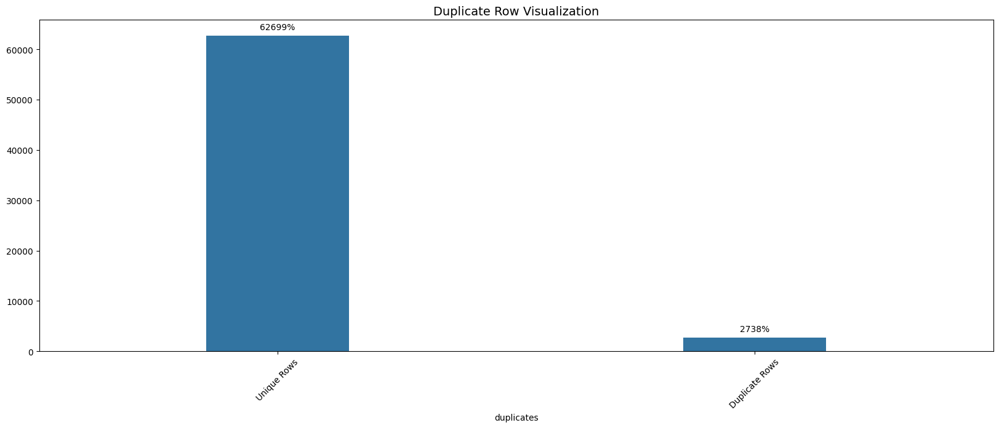

In [15]:
# create a new column -> duplicate
df['duplicates'] = df.duplicated(keep='last')
# Count duplicates and non-duplicates
duplicates_counts = df['duplicates'].value_counts()
# plot duplicates and non-duplicates values count
plot_bar_chart(duplicates_counts.index, duplicates_counts.values, title='Duplicate Row Visualization')
plt.xticks([0, 1], ['Unique Rows', 'Duplicate Rows']);

In [16]:
# drop all duplicates and drop the duplicate column
df = df.drop_duplicates(keep='last').drop(columns=['duplicates'])

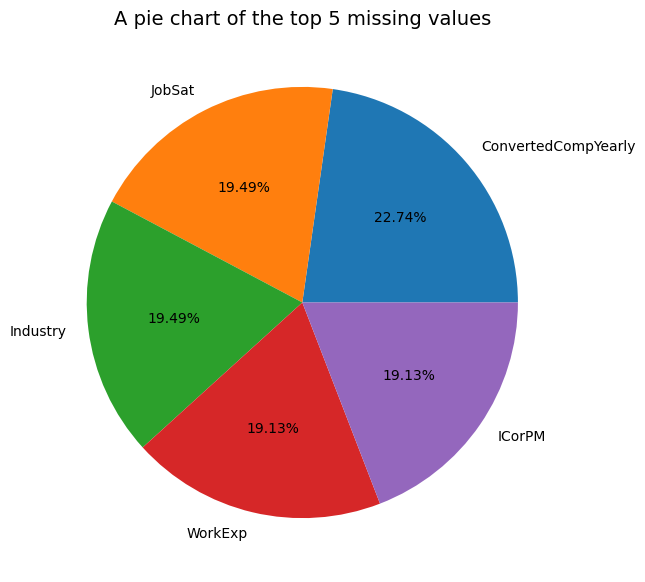

In [17]:
# ploting a pie chat of the top 5 missing values
miss_values: dict = evalute_miss_values(df)
x = miss_values.keys()
y = miss_values.values()
plot_pie_chart(y, x, title='A pie chart of the top 5 missing values')

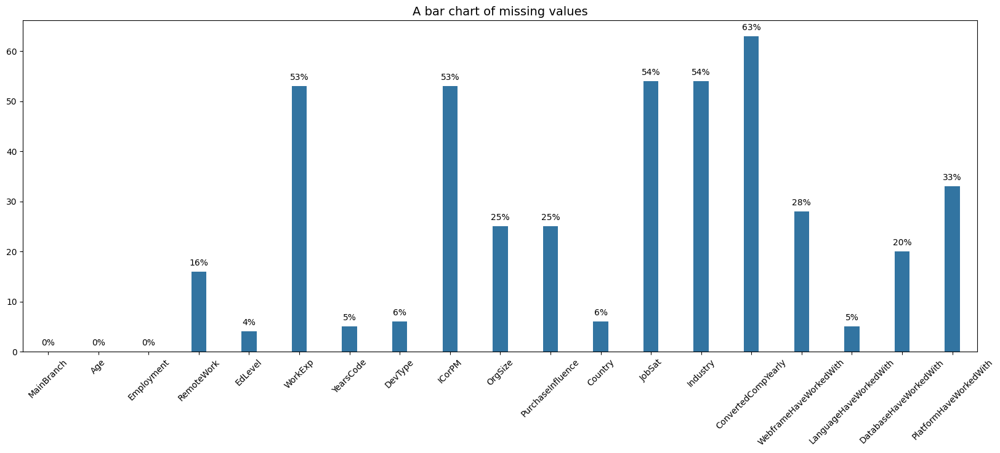

In [18]:
# Bar chart distribution of missing values
plot_bar_chart(x, y, title='A bar chart of missing values')

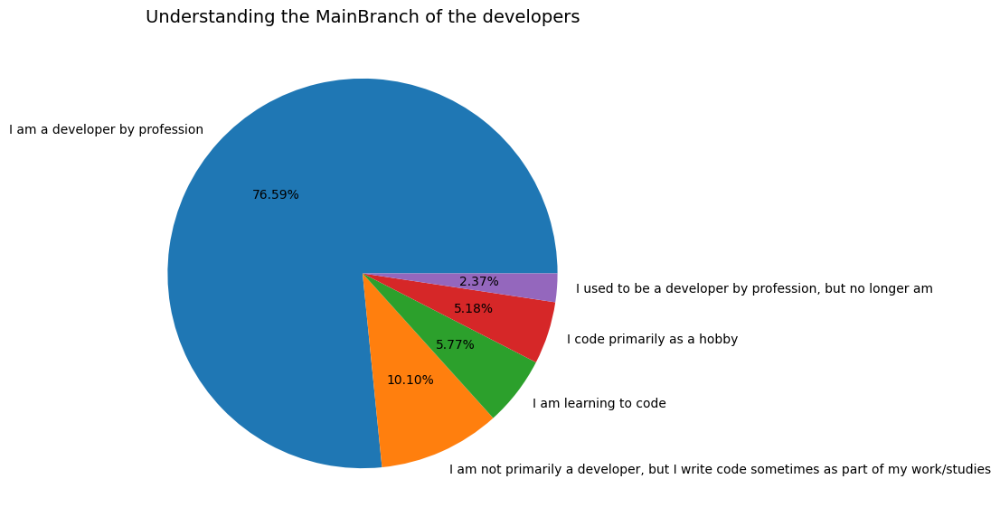

In [19]:
# Develpers distribution chart
dev_status_tag = df['MainBranch'].value_counts().index
dev_status_values = df['MainBranch'].value_counts().values

plot_pie_chart(dev_status_values, dev_status_tag, title='Understanding the MainBranch of the developers')

<Axes: ylabel='Age'>

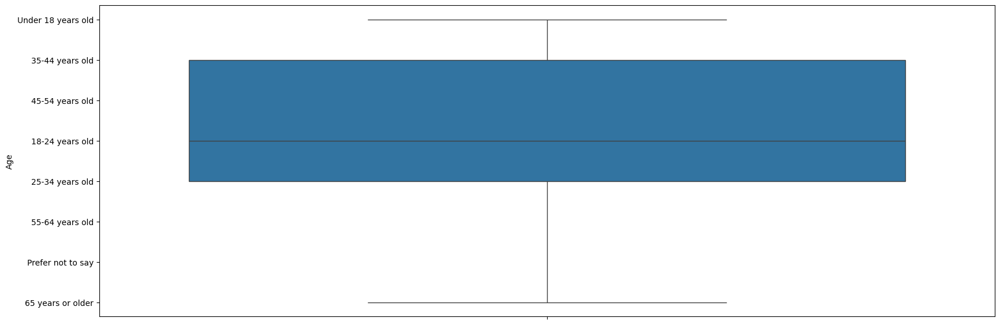

In [20]:
sns.boxplot(data=df['Age'])

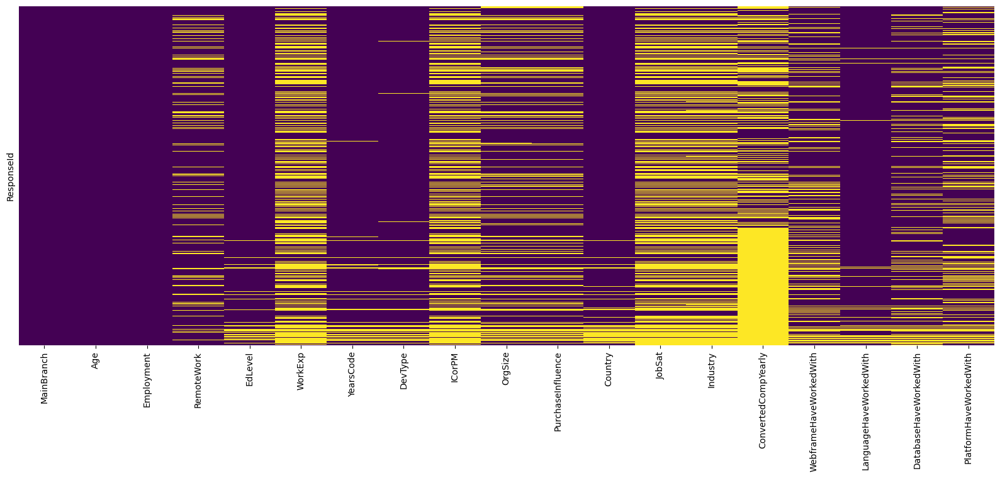

In [21]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis');

<span style="color:grey; font-size:20px;">Now let's handle missing values and formatting dataset</span>

In [22]:
# Checking the target column dimention
print(df['ConvertedCompYearly'].isnull().sum()) # 42002
print(df['ConvertedCompYearly'].notnull().sum()) # 23435

39567
23435


In [23]:
# Remoming all rows missing values in the target column
new_df = df[df['ConvertedCompYearly'].notnull()]
new_df = new_df.reset_index().drop(['ResponseId'], axis=1)

In [24]:
# get the dimension of the new dataset
shape = new_df.shape
print(f'The dataset has {shape[1]} columns and {shape[0]} rows')

The dataset has 19 columns and 23435 rows


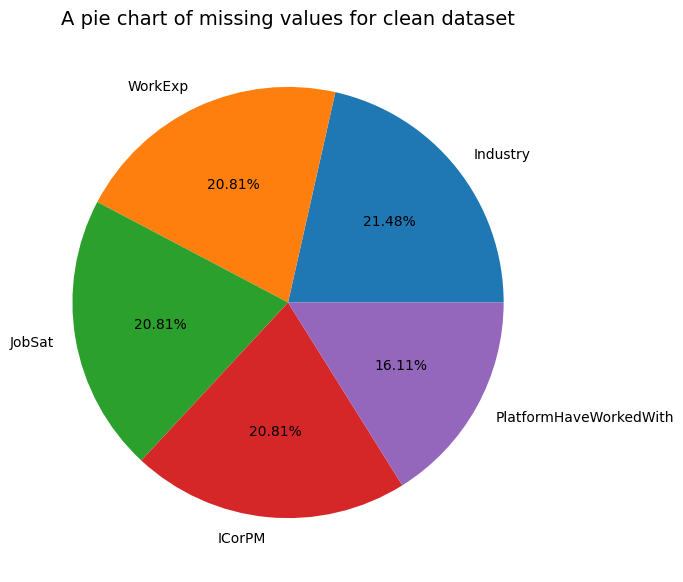

In [25]:
# ploting a pie chat of missing values on the new dataset
new_df_miss_val: dict = evalute_miss_values(new_df)
x2 = new_df_miss_val.keys()
y2 = new_df_miss_val.values()
plot_pie_chart(y2, x2, title='A pie chart of missing values for clean dataset')

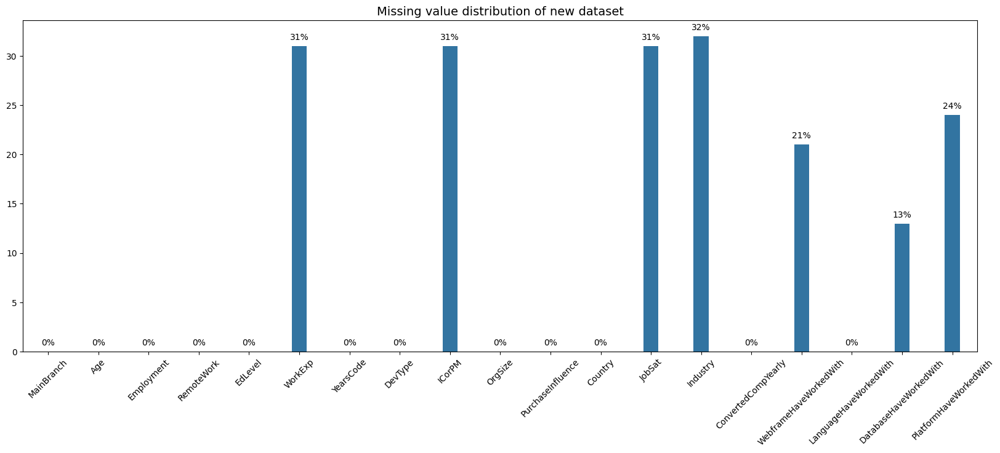

In [26]:
# Bar chart distribution of missing values on the new df
plot_bar_chart(x2, y2, title='Missing value distribution of new dataset')

In [27]:
# convert -> LanguageHaveWorkedWith, WebframeHaveWorkedWith, DatabaseHaveWorkedWith, PlatformHaveWorkedWith -> list
skills_cols = ['LanguageHaveWorkedWith', 'WebframeHaveWorkedWith','DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith']
# fill all missing values in skills cols with the mode and format data to list
for col in skills_cols:
    lang_mode = new_df[col].mode()[0]
    new_df[col]  = new_df[col].fillna(lang_mode)
    new_df[col].isnull().sum()
    new_df[col] = new_df[col].apply(lambda a: str(a).split(';'))

In [28]:
# convert skills list to frequency
for col in skills_cols:
    new_df[col] = new_df[col].apply(lambda a: len(a))
    new_df[col].astype(int)

In [29]:
# Handling -> 'RemoteWork', 'OrgSize', 'DevType', 'PurchaseInfluence'
missValColumns = ['RemoteWork', 'OrgSize', 'DevType', 'PurchaseInfluence', 'Industry', 'JobSat', 'WorkExp', 'ICorPM']
for col in missValColumns:
    colMode = new_df[col].mode()[0]
    new_df[col] = new_df[col].fillna(colMode)

new_df.isnull().sum()

MainBranch                 0
Age                        0
Employment                 0
RemoteWork                 0
EdLevel                    0
WorkExp                    0
YearsCode                 47
DevType                    0
ICorPM                     0
OrgSize                    0
PurchaseInfluence          0
Country                    0
JobSat                     0
Industry                   0
ConvertedCompYearly        0
WebframeHaveWorkedWith     0
LanguageHaveWorkedWith     0
DatabaseHaveWorkedWith     0
PlatformHaveWorkedWith     0
dtype: int64

In [30]:
# print all uniques entries in yearcode
new_df['YearsCode'].unique()

array(['3', '12', '15', '27', '7', '32', '38', '23', '50', '30', '21',
       '10', '6', '40', '20', '9', '25', '14', '11', '28', '16', '18',
       '37', '47', '1', '17', '36', '19', '24', '2', '5', '34', '48',
       '46', '26', '13', '33', '31', '45', '22', '41', '35', '4', '8',
       '44', '29', '42', 'More than 50 years', '39', '43',
       'Less than 1 year', nan, '49'], dtype=object)

In [31]:
# Handle year code missing values, formate data and covert to int()
new_df['YearsCode'] = new_df['YearsCode'].fillna(new_df['YearsCode'].mode()[0])
new_df['YearsCode'] = new_df['YearsCode'].replace(['More than 50 years', 'Less than 1 year'], [50, 0])
new_df['YearsCode']= new_df['YearsCode'].astype(int)

In [32]:
new_df['YearsCode'].unique()

array([ 3, 12, 15, 27,  7, 32, 38, 23, 50, 30, 21, 10,  6, 40, 20,  9, 25,
       14, 11, 28, 16, 18, 37, 47,  1, 17, 36, 19, 24,  2,  5, 34, 48, 46,
       26, 13, 33, 31, 45, 22, 41, 35,  4,  8, 44, 29, 42, 39, 43,  0, 49])

In [33]:
new_df.isnull().sum()

MainBranch                0
Age                       0
Employment                0
RemoteWork                0
EdLevel                   0
WorkExp                   0
YearsCode                 0
DevType                   0
ICorPM                    0
OrgSize                   0
PurchaseInfluence         0
Country                   0
JobSat                    0
Industry                  0
ConvertedCompYearly       0
WebframeHaveWorkedWith    0
LanguageHaveWorkedWith    0
DatabaseHaveWorkedWith    0
PlatformHaveWorkedWith    0
dtype: int64

<span style="color:yellow; font-size:25px;">Clasify salary as high pay or low pay </span>

In [34]:
# clasify salary as high pay or low pay
new_df['compensationClass'] = new_df['ConvertedCompYearly'].apply(lambda a: 0 if a < 55000 else 1)

<span style="color:yellow; font-size:25px;">Data visualization and relations between variables</span>

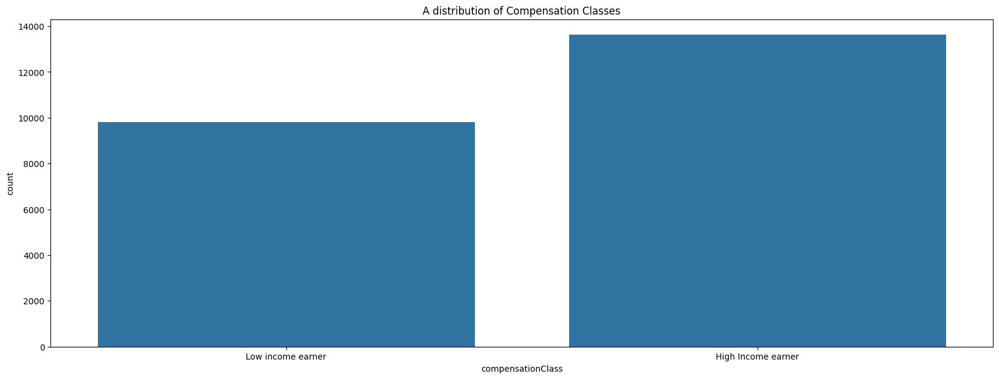

In [35]:
plot_count_plot(new_df, 'compensationClass', 'A distribution of Compensation Classes')
plt.xticks([0, 1], ['Low income earner', 'High Income earner']);

In [36]:
ratings = df.groupby(['Employment', 'RemoteWork', 'Age']).size().reset_index().rename(columns={0:'count'})
ratings

,Employment,RemoteWork,Age,count
0,"Employed, full-time","Hybrid (some remote, some in-person)",18-24 years old,1715
1,"Employed, full-time","Hybrid (some remote, some in-person)",25-34 years old,7529
2,"Employed, full-time","Hybrid (some remote, some in-person)",35-44 years old,4656
3,"Employed, full-time","Hybrid (some remote, some in-person)",45-54 years old,1879
4,"Employed, full-time","Hybrid (some remote, some in-person)",55-64 years old,674
...,...,...,...,...
556,"Student, part-time;Employed, part-time",Remote,18-24 years old,60
557,"Student, part-time;Employed, part-time",Remote,25-34 years old,24
558,"Student, part-time;Employed, part-time",Remote,35-44 years old,5
559,"Student, part-time;Employed, part-time",Remote,65 years or older,1


<Axes: xlabel='RemoteWork', ylabel='count'>

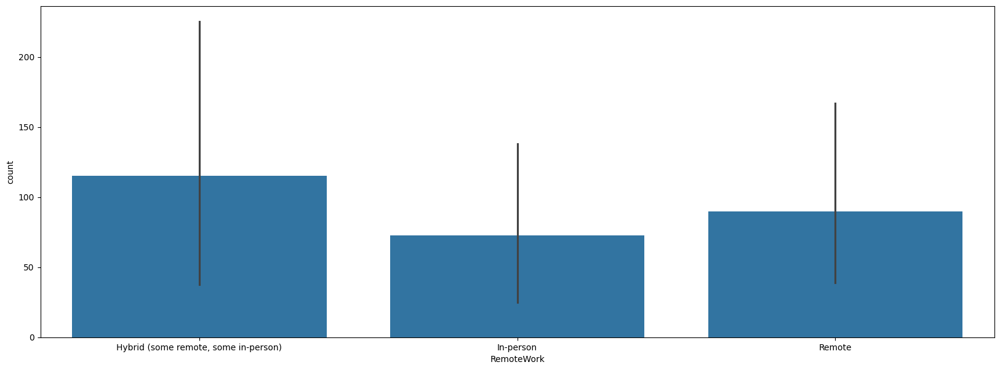

In [37]:
# observation
sns.barplot(data=ratings, y='count', x='RemoteWork')

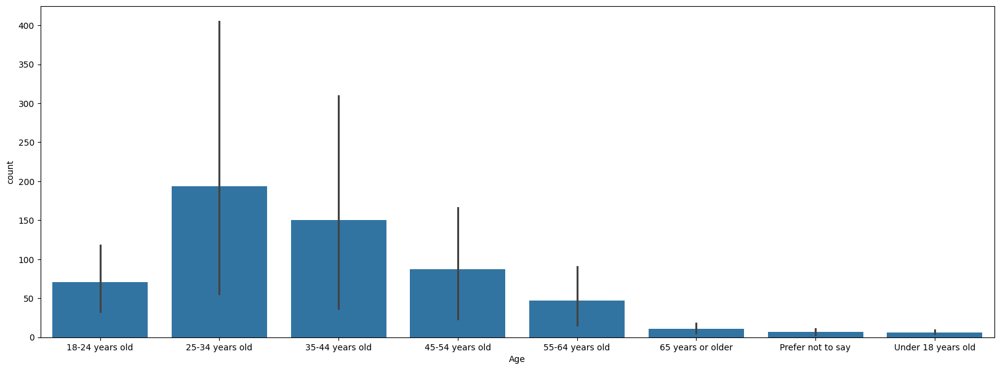

In [38]:
sns.barplot(data=ratings, y='count', x='Age');

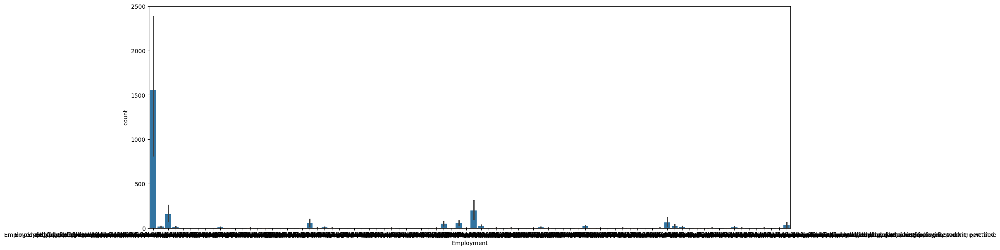

In [39]:
sns.barplot(data=ratings, y='count', x='Employment');

In [45]:
country_dist = df[['Country', 'EdLevel']].groupby(['Country', 'EdLevel']).size().reset_index().rename(columns={0:'count'})
country_dist

,Country,EdLevel,count
0,Afghanistan,"Associate degree (A.A., A.S., etc.)",2
1,Afghanistan,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",20
2,Afghanistan,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",6
3,Afghanistan,Primary/elementary school,6
4,Afghanistan,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",4
...,...,...,...
1023,Zimbabwe,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",13
1024,Zimbabwe,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",2
1025,Zimbabwe,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",1
1026,Zimbabwe,"Secondary school (e.g. American high school, G...",4


In [42]:
country_pivot = country_dist.pivot(index='RemoteWork', columns='Country', values='count')

In [301]:
# country_pivot.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='viridis');

<Axes: xlabel='EdLevel', ylabel='count'>

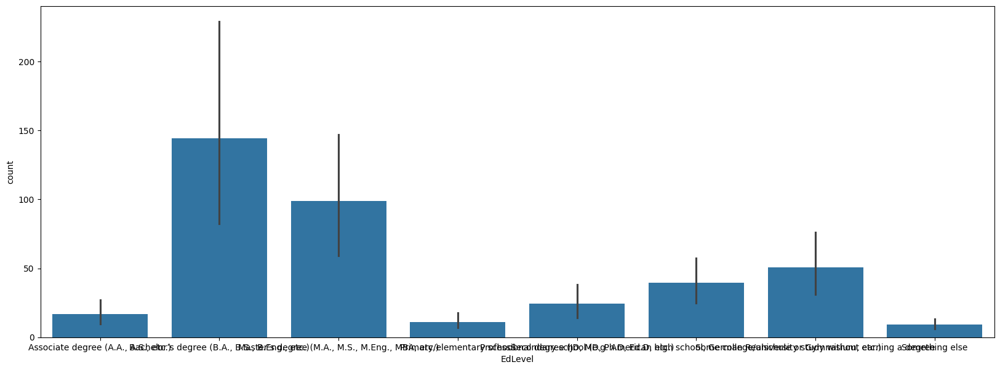

In [46]:
sns.barplot(data = country_dist, y='count', x='EdLevel')

In [47]:
devtype = df[['DevType']][df['ConvertedCompYearly'].notnull()].value_counts()
devtype_count = devtype.values
devtype_tag = devtype.index

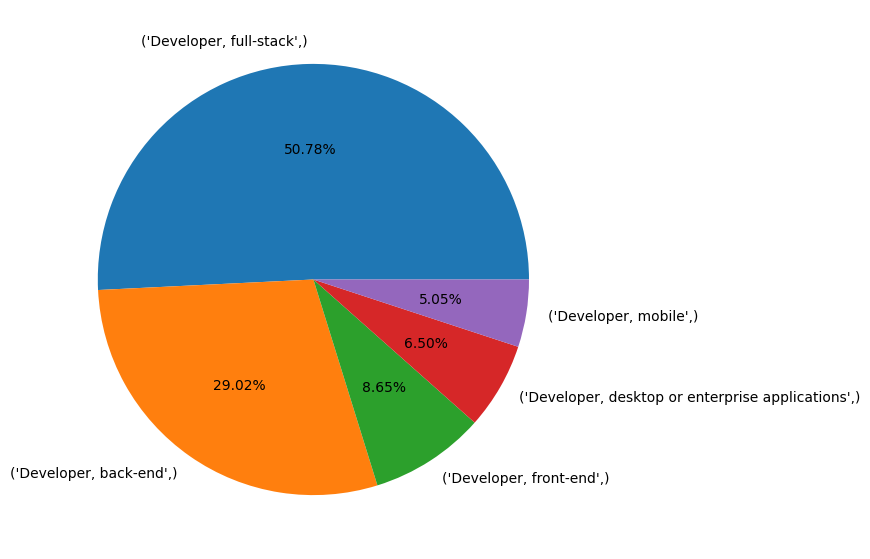

In [49]:
plt.pie(devtype_count[:5],labels=devtype_tag[:5], autopct='%1.2f%%');

In [ ]:
# sns.scatterplot(df, x='Annual Income (k$)', y='Spending Score (1-100)', palette='viridis', hue='clusterLabel')

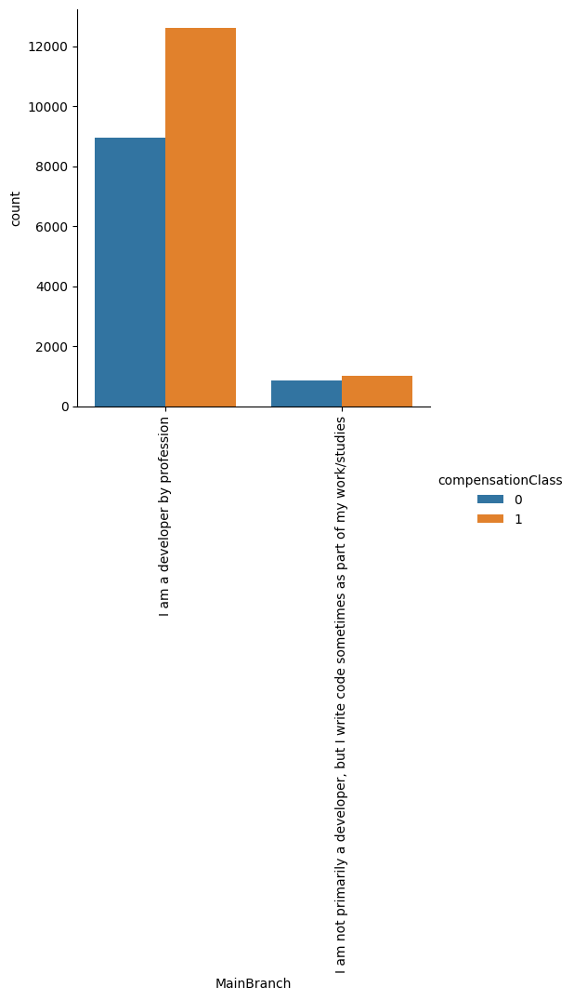

In [42]:
sns.catplot(data=new_df, kind='count', x='MainBranch', hue='compensationClass');
plt.xticks(rotation=90, fontsize=10);

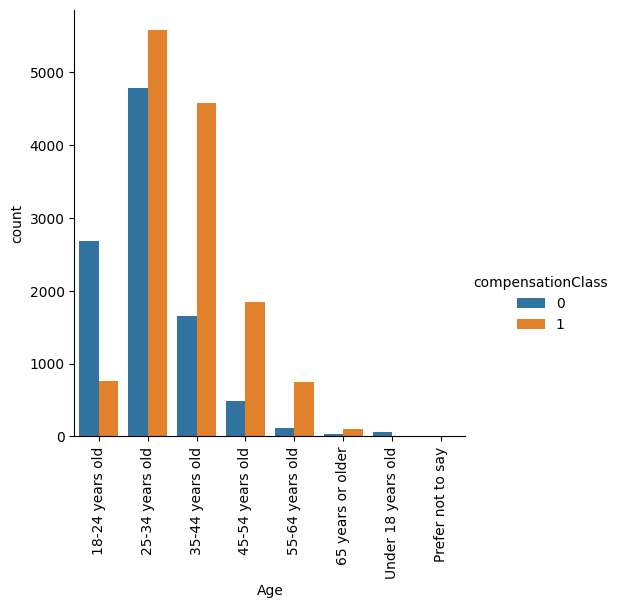

In [43]:
sns.catplot(data=new_df, kind='count', x='Age', hue='compensationClass');
plt.xticks(rotation=90, fontsize=10);

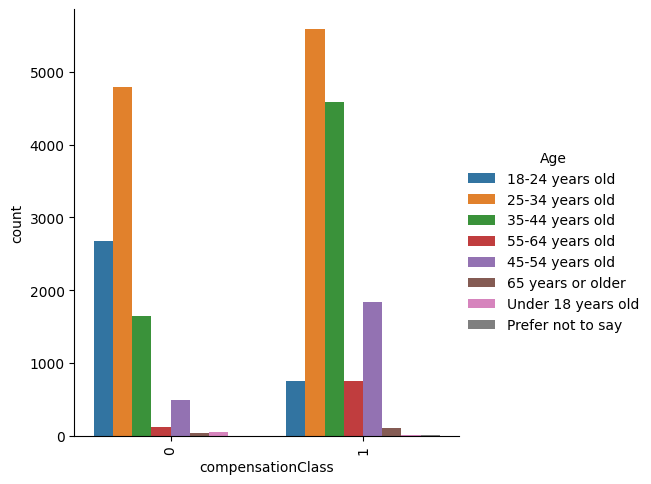

In [44]:
sns.catplot(data=new_df, kind='count', x='compensationClass', hue='Age');
plt.xticks(rotation=90, fontsize=10);


In [50]:
new_df['ConvertedCompYearly'].corr(new_df['YearsCode'])

np.float64(0.1396240181739087)

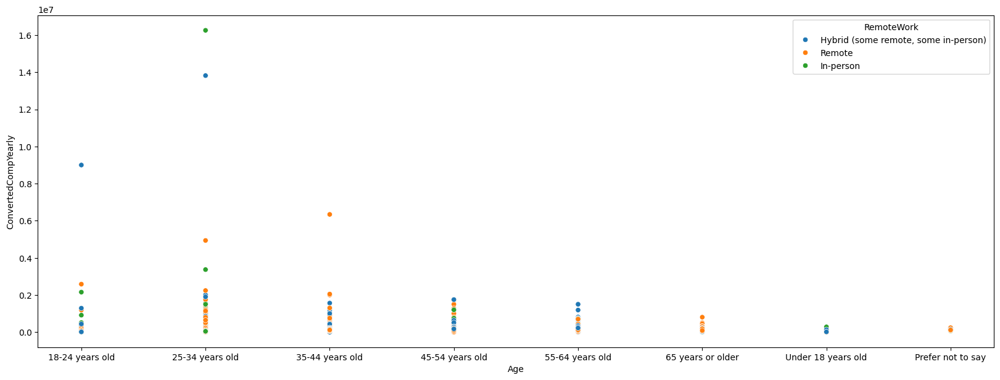

In [51]:
sns.scatterplot(data = new_df, y = 'ConvertedCompYearly', x = 'Age', hue = 'RemoteWork');
# plt.ylim(top=10)

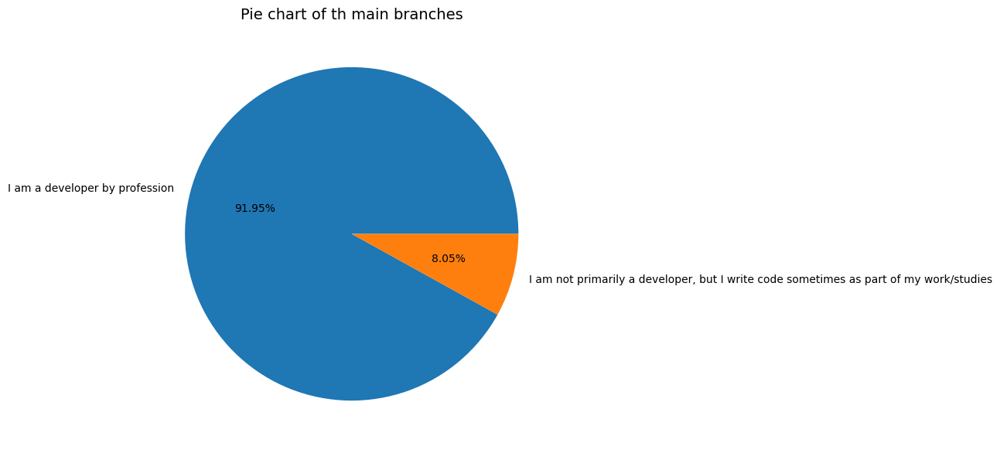

In [52]:
# Develpers distribution chart
dev_status_tag = new_df['MainBranch'].value_counts().index
dev_status_values = new_df['MainBranch'].value_counts().values

plot_pie_chart(dev_status_values, dev_status_tag, 'Pie chart of th main branches')

### LabelEncode all categorical 

In [53]:
# LabelEncode all categorical 
from sklearn.preprocessing import LabelEncoder
encode = LabelEncoder()

strColumns = new_df.select_dtypes(include=['object']).columns.tolist()
for col in strColumns:
    new_df[col] = encode.fit_transform(new_df[col])

# for col in strColumns:
#     unique = {v:k for k,v in enumerate(new_df[col].unique())}
#     new_df[col].map(unique)


In [54]:
new_df.head()

,MainBranch,Age,Employment,RemoteWork,EdLevel,WorkExp,YearsCode,DevType,ICorPM,OrgSize,PurchaseInfluence,Country,JobSat,Industry,ConvertedCompYearly,WebframeHaveWorkedWith,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,compensationClass
0,0,0,18,0,5,3.0,3,5,1,3,2,112,10.0,13,7322.0,7,11,3,2,0
1,1,1,0,0,4,3.0,12,0,0,3,1,9,8.0,13,30074.0,1,6,1,1,0
2,0,2,0,2,2,7.0,15,5,0,5,0,151,10.0,1,91295.0,3,5,3,6,1
3,0,2,28,2,2,3.0,27,13,0,9,0,52,8.0,13,53703.0,1,1,4,2,0
4,0,1,24,2,6,8.0,7,32,0,1,2,158,10.0,14,110000.0,4,5,3,1,1


### Checking correlations

In [55]:
corr = correlations(new_df, 'ConvertedCompYearly')
corr

{'MainBranch': -0.01,
 'Age': 0.112,
 'Employment': -0.041,
 'RemoteWork': 0.028,
 'EdLevel': -0.015,
 'WorkExp': 0.104,
 'YearsCode': 0.14,
 'DevType': 0.029,
 'ICorPM': 0.034,
 'OrgSize': -0.017,
 'PurchaseInfluence': -0.032,
 'Country': 0.105,
 'JobSat': 0.036,
 'Industry': -0.026,
 'WebframeHaveWorkedWith': -0.037,
 'LanguageHaveWorkedWith': 0.008,
 'DatabaseHaveWorkedWith': -0.007,
 'PlatformHaveWorkedWith': 0.018,
 'compensationClass': 0.271}

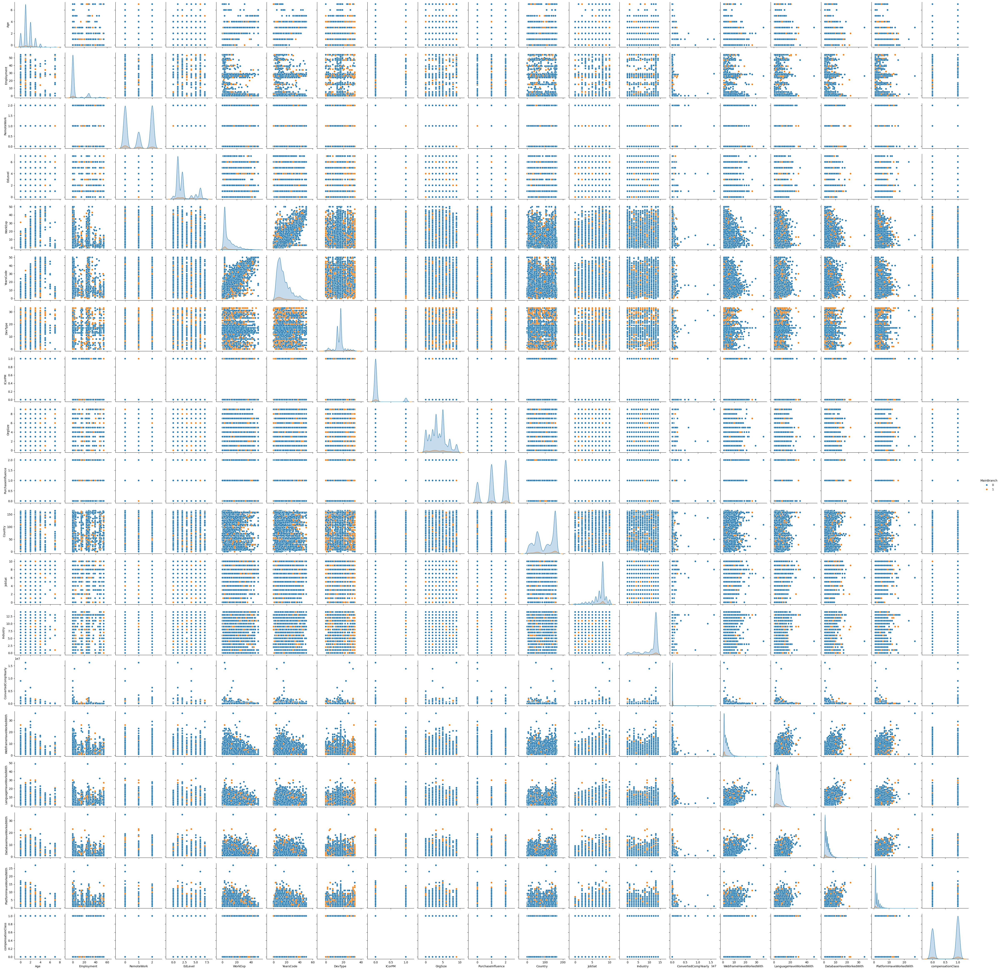

In [56]:
sns.pairplot(new_df, hue='MainBranch')

### Split dataset into feature and target && into train and test

In [88]:
# Split feature from target variable
xFeature = new_df.drop(['ConvertedCompYearly', 'compensationClass'], axis=1)

yTarget_reg = new_df['ConvertedCompYearly'] # Regression
yTarget_cls = new_df['compensationClass'] # Classification

In [89]:
# split dataset into test,main train and validation train dataset
def split_data():
    from sklearn.model_selection import train_test_split

    global x_train_main, x_val, y_train_main, y_val, x_test, y_test

    x_train, x_test, y_train, y_test = train_test_split(xFeature, yTarget_cls, test_size=0.3, random_state = 10)
    x_train_main, x_val, y_train_main, y_val = train_test_split(x_train, y_train, test_size=0.1, random_state = 10)
    
split_data()

In [90]:
x_train_main.shape, y_train_main.shape

((14763, 18), (14763,))

In [91]:
# Let's find variance
x_train_main.var(axis=0)

# Our featurs are not comparable because our features do not have the same scale
# Therefore lets scale 

MainBranch                   0.073318
Age                          1.115745
Employment                 141.261036
RemoteWork                   0.833919
EdLevel                      3.284072
WorkExp                     67.053353
YearsCode                   95.793924
DevType                     34.242311
ICorPM                       0.076549
OrgSize                      5.571334
PurchaseInfluence            0.576176
Country                   2771.753109
JobSat                       3.265885
Industry                    15.431995
WebframeHaveWorkedWith       6.057968
LanguageHaveWorkedWith       8.941748
DatabaseHaveWorkedWith       4.526566
PlatformHaveWorkedWith       2.586405
dtype: float64

### Scaling -> MinMax Scaler

In [92]:
# data normalization using minmaxscaler
def scale_data():
    from sklearn.preprocessing import MinMaxScaler

    global scale, x_train_main, x_val, x_test

    scale = MinMaxScaler()
    scale = scale.fit(x_train_main)

    x_train_main = scale.transform(x_train_main)
    x_val = scale.transform(x_val)
    x_test = scale.transform(x_test)

scale_data()

In [93]:
len(x_train_main[0])

18

#### Baseline Model: Logistic regression

In [94]:
# lets build a baseline model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

lgg = LogisticRegression()

lgg_v1 = lgg.fit(x_train_main, y_train_main)

pred_baseline_train = lgg_v1.predict(x_train_main)
pred_baseline_val = lgg_v1.predict(x_val)

baseline_score_train = round(accuracy_score(y_train_main, pred_baseline_train), 4)
baseline_score_val = round(accuracy_score(y_val, pred_baseline_val), 4)

# baseline test accuracy score
baseline_score_train, baseline_score_val

(0.7139, 0.7093)

#### Feature selection

<span style="color:yellow; font-size:17px;">Using variance for feature selection</span>

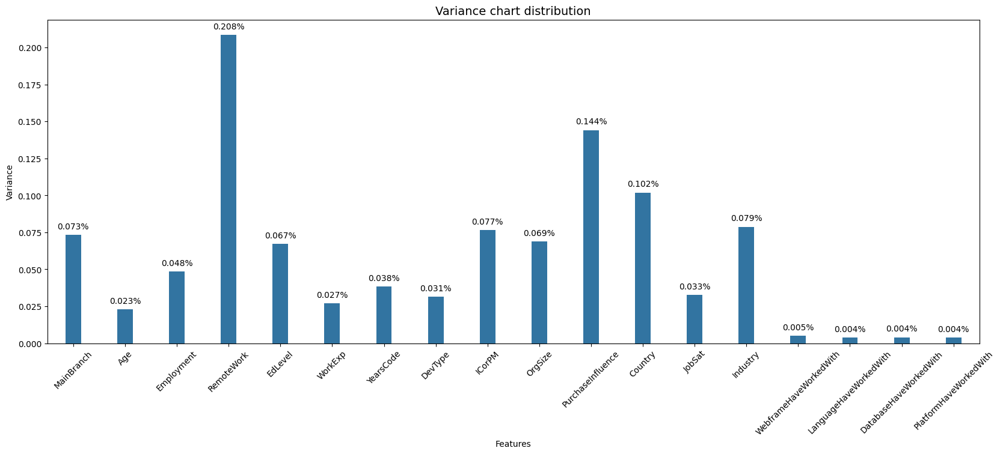

In [95]:
# Find variance and plot the variance for each column
variance = x_train_main.var(axis=0) # y
columns = xFeature.columns

plot_bar_chart(x = columns, y=variance, title='Variance chart distribution')
plt.xlabel('Features')
plt.ylabel('Variance');


<span style="color:brown; font-size:17px;">Drop columns with variance less than 0.005%</span>

In [96]:
# drop columns
cols_var_less_than_004 = ['LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith']
xFeature = xFeature.drop(columns=cols_var_less_than_004, axis=1)

# split dataset
split_data()
# scale data
scale_data()

In [97]:
len(x_train_main[0]), len(x_test[0])

(15, 15)

In [98]:
# test the accuracy of our data using the baseline model
lgg_v2 = lgg.fit(x_train_main, y_train_main)

pred_novariance_train = lgg_v2.predict(x_train_main)
pred_novariance_val = lgg_v2.predict(x_val)

# baseline test accuracy score
novariance_score_train = round(accuracy_score(y_train_main, pred_novariance_train), 4)
novariance_score_val = round(accuracy_score(y_val, pred_novariance_val), 4)

# baseline test accuracy score
novariance_score_train, novariance_score_val

(0.7104, 0.702)

In [99]:
# the model performs better with the three columns - > 'LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith'
baseline_score_train > novariance_score_train , baseline_score_val > novariance_score_val

(True, True)

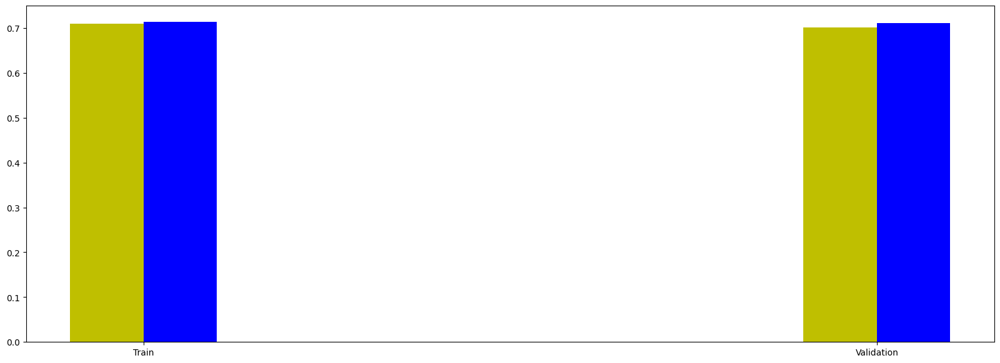

In [100]:
import numpy as np

val = (baseline_score_val, novariance_score_val)
train = (baseline_score_train, novariance_score_train)

x = np.arange(2)
width=0.1

plt.bar(x + width / 2, train, width=width, color='b')
plt.bar(x - width / 2, val, width=width, color='y')
plt.xticks(x, ['Train', 'Validation']);

In [101]:
# reintrodunce the columns
xFeature = new_df.drop(['ConvertedCompYearly', 'compensationClass'], axis=1)
# split dataset
split_data()
# scale data
scale_data()

In [102]:
len(x_train_main[0]), len(x_test[0])

(18, 18)

<span style="color:yellow; font-size:17px;">Using K-best feature selection method</span>

In [103]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif

k_best = len(xFeature.columns) + 1

k_scores = []

for k in range(1, k_best):
    selector =  SelectKBest(mutual_info_classif, k=k)
    selector.fit(x_train_main, y_train_main)
    
    selector_train = selector.transform(x_train_main)
    selector_test = selector.transform(x_test)

    lgg_v3 = lgg.fit(selector_train, y_train_main)
    pred_selector_test = lgg_v3.predict(selector_test)

    # kbest test accuracy score
    selector_score_test = round(accuracy_score(y_test, pred_selector_test), 4)

    k_scores.append(selector_score_test)

In [104]:
len(k_scores)

18

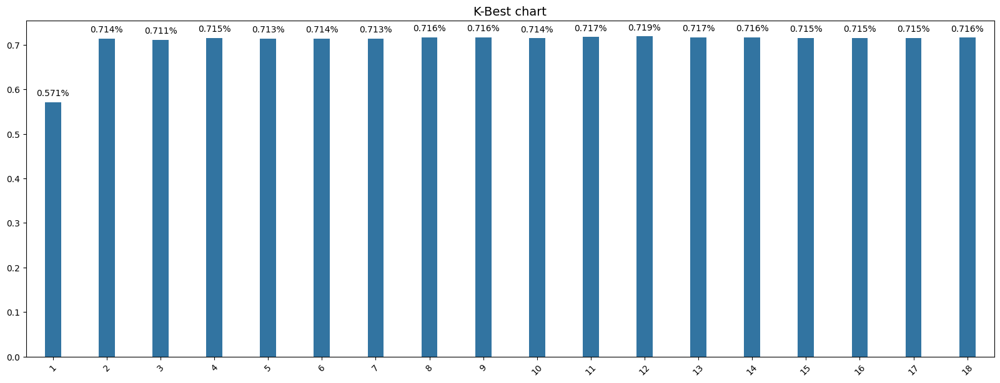

In [105]:
x = np.arange(k_best-1)
width=0.4

plot_bar_chart(x, k_scores, 'K-Best chart')
plt.xticks(x, range(1,k_best));

In [107]:
print(k_scores)

max_value = max(k_scores)
max_index = k_scores.index(max_value) + 1

max_index

[0.5708, 0.7138, 0.7111, 0.7148, 0.7134, 0.7136, 0.7134, 0.7161, 0.7164, 0.7144, 0.7173, 0.7185, 0.7168, 0.7161, 0.7151, 0.715, 0.7147, 0.716]


12

<span style="color:brown; font-size:17px;">Let's select the best 17 features</span>

In [109]:
selector = SelectKBest(mutual_info_classif, k = max_index)
selector.fit(x_train_main, y_train_main)

selected_features_mask = selector.get_support()
selected_features = xFeature.columns[selected_features_mask]

selected_features

Index(['Age', 'Employment', 'RemoteWork', 'EdLevel', 'WorkExp', 'YearsCode',
       'DevType', 'OrgSize', 'Country', 'JobSat', 'LanguageHaveWorkedWith',
       'DatabaseHaveWorkedWith'],
      dtype='object')

### Cluster analysis -> KMeans

In [ ]:
from sklearn.cluster import KMeans




#### Classification Problem -> KNN

In [174]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

train_val = []
train_new = []

depth = []


for k in range(1,25):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn = knn.fit(x_train_, y_train_)

    knn_pred = knn.predict(x_train_)

    knn_score = accuracy_score (y_train_, knn_pred )
    train_new.append ( knn_score )
    
    knn_pred = knn.predict(x_val)
    val_score = accuracy_score (y_val , knn_pred)
    train_val.append ( val_score )
    depth.append(k)

KeyboardInterrupt: 

In [131]:
train_new, train_val

([1.0,
  0.8263903000745106,
  0.8280159859107228,
  0.7900833163991059,
  0.7899478425794215,
  0.7686784528889792,
  0.7700331910858227,
  0.7592630224209171,
  0.7625821310031836,
  0.7565535460272302,
  0.7587211271421798,
  0.753302174354806,
  0.7526925421662264,
  0.7488315383052225,
  0.7488992752150647,
  0.7470026417394838,
  0.7453769559032717,
  0.74158368895211,
  0.7424642687800582,
  0.7417868996816365,
  0.7395515816568449,
  0.7406353722143196,
  0.7404321614847931,
  0.7381291065501592],
 [0.6508226691042047,
  0.6221815965874467,
  0.676416819012797,
  0.6593540524070689,
  0.6831200487507617,
  0.6751980499695308,
  0.6916514320536259,
  0.6892138939670932,
  0.6995734308348568,
  0.6873857404021938,
  0.7050578915295551,
  0.6873857404021938,
  0.6983546617915904,
  0.687995124923827,
  0.6989640463132236,
  0.6867763558805606,
  0.6946983546617916,
  0.6855575868372943,
  0.6928702010968921,
  0.6953077391834247,
  0.6983546617915904,
  0.6928702010968921,
  0.697

In [132]:
# Trying out grid search for K value
from sklearn.model_selection import GridSearchCV

param_grid = {'n_neighbors': list(range(1, 25))}

grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=10)
grid_search.fit(x_train_, y_train_)
print("Best K:", grid_search.best_params_['n_neighbors'])


Best K: 24


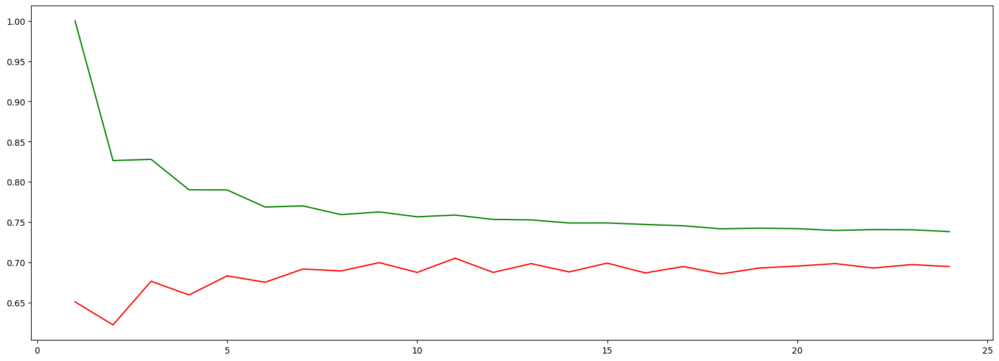

In [ ]:
plt.plot(depth, train_val, 'r')
plt.plot(depth, train_new, 'g')

In [138]:
knn = KNeighborsClassifier(n_neighbors=11)
knn = knn.fit(x_train_, y_train_)
knn_pred = knn.predict(x_train_)

knn_score = accuracy_score (y_train_, knn_pred )

knn_score

0.7587211271421798

In [139]:
knn_pred = knn.predict(x_test)
test_score = accuracy_score (y_test, knn_pred )

test_score

0.7105674868439766

### Classification Problem -> Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

val = []
train = []
states = []

for st in range(1,20):
    clf = DecisionTreeClassifier(random_state=st)

    clf = clf.fit(X=x_train_, y=y_train_)
    
    clf_pred = clf.predict(x_train_)
    clf_score = accuracy_score(y_train_, clf_pred)
    train.append(clf_score)

    clf_pred = clf.predict(x_val)
    clf_score = accuracy_score(y_val, clf_pred)
    val.append(clf_score)
    
    states.append(st)


In [1]:
plt.plot(states, val, 'r');
plt.plot(states, train, 'g');

NameError: name 'plt' is not defined

In [ ]:
# criterion{“gini”, “entropy”, “log_loss”}, default=”gini” -> No change in prediction
clf = DecisionTreeClassifier(criterion='log_loss', random_state=10)

clf = clf.fit(X=x_train_, y=y_train_)

clf_pred = clf.predict(x_train_)

clf_score = accuracy_score(y_train_, clf_pred)

clf_score

1.0

In [145]:
clf_pred = clf.predict(x_test)

clf_score = accuracy_score(y_test, clf_pred)

clf_score

0.758640307210923

[Text(0.6763943301411972, 0.9861111111111112, 'x[10] <= 0.942\nlog_loss = 0.98\nsamples = 14763\nvalue = [6150, 8613]'),
 Text(0.3784078252201538, 0.9583333333333334, 'x[6] <= 0.21\nlog_loss = 0.997\nsamples = 10785\nvalue = [5732, 5053]'),
 Text(0.5274010776806755, 0.9722222222222223, 'True  '),
 Text(0.12402445934060978, 0.9305555555555556, 'x[1] <= 0.071\nlog_loss = 0.838\nsamples = 4986\nvalue = [3652, 1334]'),
 Text(0.037753205055926393, 0.9027777777777778, 'x[6] <= 0.09\nlog_loss = 0.512\nsamples = 1658\nvalue = [1469, 189]'),
 Text(0.006206025617896446, 0.875, 'x[13] <= 0.043\nlog_loss = 0.207\nsamples = 430\nvalue = [416, 14]'),
 Text(0.0050514162006133866, 0.8472222222222222, 'x[10] <= 0.876\nlog_loss = 0.317\nsamples = 192\nvalue = [181, 11]'),
 Text(0.004474111491971857, 0.8194444444444444, 'x[2] <= 0.463\nlog_loss = 0.401\nsamples = 138\nvalue = [127.0, 11.0]'),
 Text(0.0038968067833303264, 0.7916666666666666, 'x[10] <= 0.855\nlog_loss = 0.472\nsamples = 109\nvalue = [98, 1

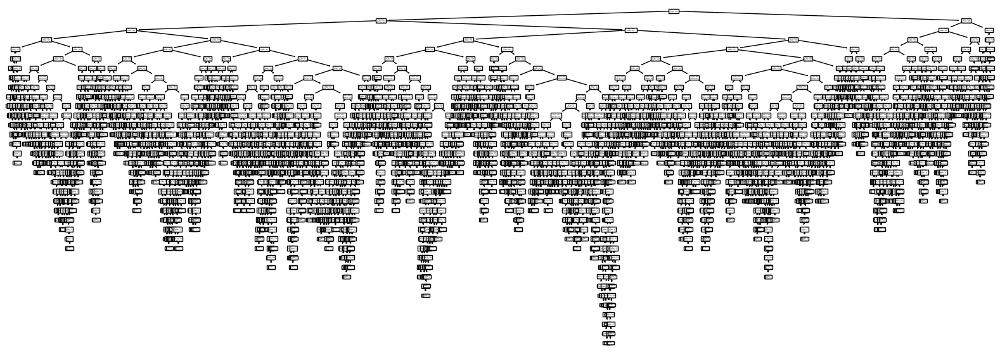

In [146]:
from sklearn import tree

tree.plot_tree(clf);

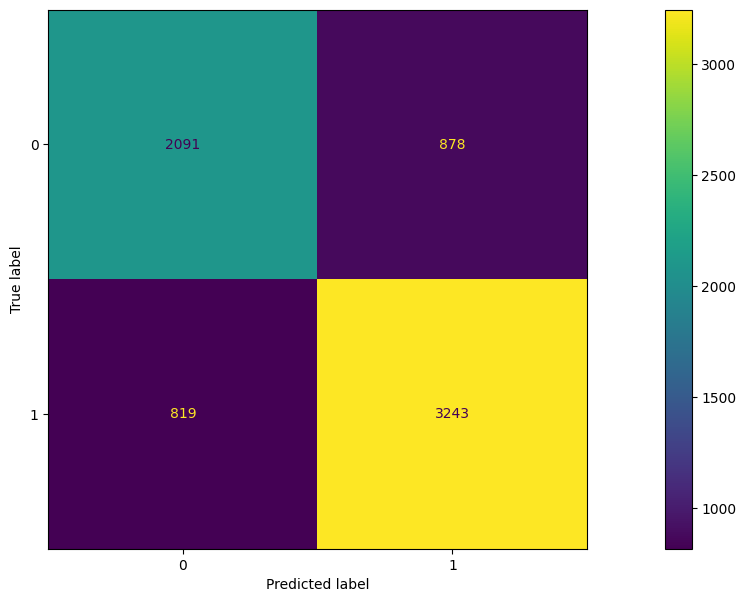

In [ ]:
# validations
from sklearn import metrics

confusion_matrix = metrics.confusion_matrix(y_test, clf_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [0, 1])
cm_display.plot()

### Regression Problem -> Linear regrtession

In [148]:
# split dataset for regression problem

x_train, x_test, y_train, y_test = train_test_split(x, y1, test_size=0.3, random_state = 10)

In [149]:
scale = MinMaxScaler()

scale = scale.fit(x_train)

x_train = scale.transform(x_train)

x_test = scale.transform(x_test)

In [150]:
from sklearn.linear_model import LinearRegression

lnr = LinearRegression()

lnr = lnr.fit(X = x_train, y = y_train)


In [151]:
lnr.intercept_

np.float64(14676.44408846955)

In [152]:
lnr_pred = lnr.predict(x_train)

In [153]:
from sklearn.metrics import r2_score, mean_squared_error

mse = mean_squared_error(y_train, lnr_pred)

mse

np.float64(24509860080.99541)